## Oscillation (Two Dimensions)

### Equations of Motion

Restoring force :
$$
\mathbf{F}=-k\mathbf{r}
$$
Two-dimensional force components :
$$
\begin{align*}
F_x& = -kr\cos\theta = -kx\\
F_y& = -kr\sin\theta = -ky
\end{align*}
$$
The equations of motions are :
\begin{align*}
\ddot{x}+\omega_0^2x&=0\\
\ddot{y}+\omega_0^2y&=0
\end{align*}
The **general solution** are:
\begin{align}
x(t)&=A\cos(\omega_0 t-\alpha)\\
y(t)&=B\cos(\omega_0 t-\beta)
\end{align}
The **phase difference** :
$$
\delta=\alpha-\beta
$$
If $\delta=\frac{\pi}{2},$ then the equation of path of particle is :
$$
\frac{x^2}{A^2}+\frac{y^2}{B^2}=1,\quad\text{where }\delta=\pm\frac{\pi}{2}
$$

### Phase Space
Phase space is obtained by plotting graph of $\dot{p}_i$ against $p_i$.

For our case, we have two phase space since we have two Cartesian coordinates $\{x,y\}$. Therefore, we must plot $\{\dot{x},x\}$ and $\{\dot{y},y\}.$

---
Cartesian coordinates (pendulum 1) :
$$
\begin{cases}
x_1=l_1\sin\theta_1\\
y_1=-l_1\cos\theta_1
\end{cases}
$$
Cartesian coordinates (pendulum 2) :
$$
\begin{cases}
x_2=l_1\sin\theta_1+l_2\sin\theta_2\\
y_2=-(l_1\cos\theta_1+l_2\cos\theta_2)
\end{cases}
$$
Velocities (pendulum 1) :
$$
\begin{cases}
\dot{x}_1=l_1\dot{\theta}_1\cos\theta_1\\
\dot{y}_1=l_1\dot{\theta}_1\sin\theta_1
\end{cases}
$$
Velocities (pendulum 2) :
$$
\begin{cases}
\dot{x}_2=l_1\dot{\theta}_1\cos\theta_1+l_2\dot{\theta}_2\cos\theta_2\\
\dot{y}_2=l_1\dot{\theta}_1\sin\theta_1+l_2\dot{\theta}_2\sin\theta_2
\end{cases}
$$

### Code

In [28]:
# 1. Helper functions
import numpy as np

# Equations of motion
def x_bob(t, alpha):
    return A * np.cos(omega_x*t - alpha)

def y_bob(t, beta):
    return B * np.cos(omega_y*t - beta)

# Velocities
def vel_x_bob(t, alpha):
    return - A * omega_x * np.sin(omega_x*t - alpha)

def vel_y_bob(t, beta):
    return - B * omega_y * np.sin(omega_y*t - beta)

In [35]:
# 2. Calculates arrays of data points
import numpy as np

# Parameters
A = 1
B = 1
k_x = 1
k_y = 1
m_x = 1
m_y = 1
omega_x = 16 #np.sqrt(k_x/m_x)
omega_y = 1 #np.sqrt(k_y/m_y)

# Phase difference
alpha = 90 * np.pi/180
beta = 0

# Arrays to keep x and y values
x = []
y = []

# Arrays for x and y velocities
v_x = []
v_y = []

# Generate data points
t = 0 # s
dt = 0.1 # s
duration = 200 # frames
for frame in range(duration):
    x.append(x_bob(t,alpha))
    y.append(y_bob(t,beta))
    v_x.append(vel_x_bob(t,alpha))
    v_y.append(vel_y_bob(t,beta))

    t += dt

print(x)
print(y)

[6.123233995736766e-17, 0.9995736030415051, -0.05837414342758015, -0.9961646088358406, 0.1165492048504937, 0.9893582466233818, -0.1743267812229797, -0.9791777291513173, 0.23150982510153728, 0.9656577765492779, -0.28790331666506364, -0.9488444979181245, 0.3433149288198971, 0.9287952340772397, -0.39755568312143785, -0.9055783620066216, 0.4504405942753941, 0.8792730616507201, -0.5017893010205818, -0.8499690458793215, 0.551426681241695, 0.8177662545264387, -0.5991834492142696, -0.7827745135506466, 0.6448967329448769, 0.7451131604793405, -0.6884106296376794, -0.7049106374142392, 0.7295767373928669, 0.6623040529862282, -0.7682546613236794, -0.6174387147534464, 0.8043124923659257, 0.5704676336373562, -0.8376272571470421, -0.5215510020868891, 0.8680853373804348, 0.4708556477503631, -0.895582857354785, -0.41855446451839473, 0.9200260381968012, 0.36482582287821097, -0.9413315176992364, -0.309852961590292, 0.9594266346233851, 0.25382336276203105, -0.9742496765064983, -0.1969281124496925, 0.985750

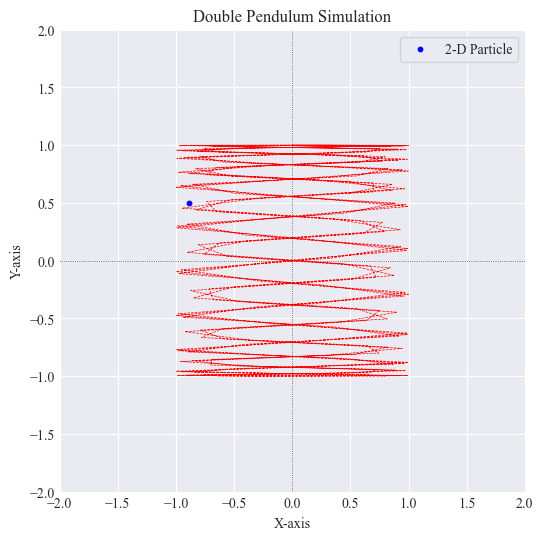

In [36]:
# 3. Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from IPython.display import HTML

# Plot style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['font.family'] = "Times New Roman"
plt.rcParams['figure.dpi'] = 100

# Create plots
fig, ax = plt.subplots(figsize=(6,6))

# Customize axes
ax.set_title(r"Double Pendulum Simulation")
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_xlim(-(A+1), A+1)
ax.set_ylim(-(B+1), B+1)
ax.axhline(y=0, ls=':', lw=0.5, color='black')
ax.axvline(x=0, ls=':', lw=0.5, color='black')

# Pendulum 1
line, = ax.plot([], [], c='red', lw=0.5, ls='--')
scat = ax.scatter([], [], c='blue', s=10, label=f'2-D Particle')


# # Extra legends (dummy handles with no actual plot)
# info_labels = [
#     Line2D([], [], color='none', label=f'$\\ell_1 = {l1}$'),
#     Line2D([], [], color='none', label=f'$\\ell_2 = {l2}$'),
#     Line2D([], [], color='none', label=f'$m_1 = {m1}$'),
#     Line2D([], [], color='none', label=f'$m_2 = {m2}$'),
#     Line2D([], [], color='none', label=f'$\\theta_1 = {180 * i_theta1 / np.pi:.2f}\\,^\\circ$'),
#     Line2D([], [], color='none', label=f'$\\theta_2 = {180 * i_theta2 / np.pi:.2f}\\,^\\circ$'),
# ]

# Legends
# ax.legend(handles=[scat1, scat2] + info_labels, fontsize='xx-small', frameon=True)
ax.legend(frameon=True)

# plt.close() # Prevent Jupyter from displaying extra image

def update(frame):
    # For each frame, update the data stored on each artist

    # Line (tracing)
    line.set_data(x[:frame], y[:frame])
    
    # Scatter
    data = np.stack([x[frame], y[frame]]).T
    scat.set_offsets(data)

    # Return all modified artists
    return line, scat

ani = animation.FuncAnimation(fig=fig, func=update, frames=len(x), interval=dt*1000, blit=True)

# PLay the animation
HTML(ani.to_jshtml()) # Display inline
# ani.save('2-D-pendulum.gif', writer=animation.PillowWriter(fps=1/dt), dpi=200)